<a href="https://colab.research.google.com/github/bmericskay/GeoPandas/blob/main/Seance4_AnalyseSpatiale_Urbanisme.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📒 Séance 4 - Analyse spatiale de données urbanistiques  🌐 🏬

**Mettre en place des chaînes de traitements documentées automatisées et reproductibles**


* Jointure spatiales et agrégations spatiales
* Opérateur de recouvrement (intersect, difference, union,...)
* Analyses de recouvrement
* Analyse du plus proche voisin
* Création d'index spatial
* Analyse spatiale à différentes échelles
* Travailler avec un volume important de données (plusieurs millions d'entités spatiales sur un département)
* Mettre en place une chaîne de traitements automatisée et reproductible

## 🛠 Configuration environnement de travail

In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal
# Install rtree - Geopandas requirment
!apt install python3-rtree
# Install Geopandas
!pip install geopandas
# Install Fiona
!pip install Fiona
# Instal contextily (fonds de carte)
!pip install contextily
# Install mapclassify (cartographie thématique)
!pip install mapclassify
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie interactive
!pip install folium
# Install scalebar
!pip install matplotlib_scalebar

In [ ]:
#Importation des librairies nécessaires
import pandas as pd #Gestion de données
import matplotlib.pyplot as plt #Visualisation de données
import geopandas as gpd #Gestion données spatiales
import pygeos #Opérations sur les géométrie de données spatiales
import contextily as ctx #Fonds de carte
import fiona as np #lecture et écriture de données spatiales
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
import folium #Cartographie interactive
import mapclassify #Cartographie thématique
from matplotlib_scalebar.scalebar import ScaleBar #Echhelle cartographique


# 🔳 Analyse spatiale avec des opérateurs métriques et de recouvrement

## Récupération et préparation des données

In [ ]:
#Téléchargement des datas depuis le site opendata de IDF Mobilité
!wget -O ArretsTC.geojson https://data.iledefrance-mobilites.fr/api/explore/v2.1/catalog/datasets/emplacement-des-gares-idf-data-generalisee/exports/geojson?lang=fr&timezone=Europe%2FBerlin

#Téléchargement des datas depuis le site opendata de Paris
!wget -O IRIS.geojson https://data.iledefrance.fr/explore/dataset/iris/download/?format=geojson&refine.dep=75&timezone=Europe/Berlin&lang=fr

<Axes: >

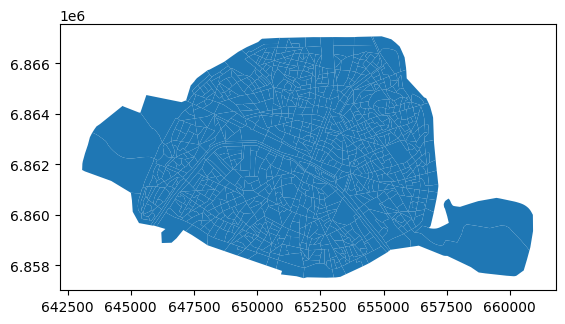

In [7]:
#Importer et reprojeter la couche des IRIS de Paris

IRIS= gpd.read_file("IRIS.geojson", encoding='utf-8')
IRIS = IRIS[(IRIS["dep"] == 75)]
IRIS = IRIS.to_crs(2154)
IRIS.plot()

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terrer,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry
0,"{'lon': 2.65038766980848, 'lat': 48.7956548195...",10,Roissy-en-Brie,None,None,67839,Roissy-en-Brie,46568,Roissy-en-Brie,A01843,...,0,0,0,0,SNCF,1,0,674317.7148,6.855121e+06,POINT (674317.715 6855120.528)
1,"{'lon': 2.950060382752808, 'lat': 48.960226489...",16,Trilport,None,None,68984,Trilport,47962,Trilport,A01844,...,0,0,0,0,SNCF,1,0,696343.0315,6.873365e+06,POINT (696343.031 6873364.738)
2,"{'lon': 3.2193028128261068, 'lat': 48.97402657...",21,Nanteuil-Saâcy,None,None,69072,Nanteuil - Saâcy,47482,Nanteuil - Saâcy,A01844,...,0,0,0,0,SNCF,1,1,716054.7816,6.874921e+06,POINT (716054.782 6874920.533)


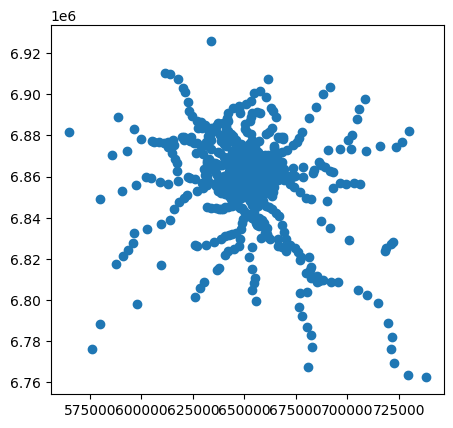

In [4]:
#Importer la couche des arrêts de TC

ArretsTC= gpd.read_file("ArretsTC.geojson", encoding='utf-8')
ArretsTC = ArretsTC.to_crs(2154)
ArretsTC.plot()
ArretsTC.head(3)

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,x,y,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry
0,"{'lon': 2.3442733454213514, 'lat': 48.85105028...",110060,Cluny-La Sorbonne,None,None,73620,Cluny La Sorbonne,44877,Saint-Michel Notre-Dame,A01543,...,651882.3097,6.861423e+06,Sorbonne 3,75105,2003,H,751052003,Paris 5e Arrondissement,75,POINT (651882.310 6861422.982)
1,"{'lon': 2.3269998588808716, 'lat': 48.87380673...",103061,Havre-Caumartin,None,None,73688,Gare Saint-Lazare,58718,Haussmann Saint-Lazare,A01536 / A01542,...,650636.3658,6.863964e+06,Chaussee d'Antin 4,75109,3404,A,751093404,Paris 9e Arrondissement,75,POINT (650636.366 6863963.972)
2,"{'lon': 2.322943412243541, 'lat': 48.866285803...",101061,Concorde,None,None,71298,Concorde,45676,Concorde,A01534 / A01541 / A01545,...,650331.6676,6.863130e+06,Concorde Jar Chps Elysees,75108,2907,D,751082907,Paris 8e Arrondissement,75,POINT (650331.668 6863130.246)
3,"{'lon': 2.3138819376821593, 'lat': 48.86779973...",101063,Champs-Élysées – Clemenceau,Grand Palais,None,71305,Champs-Élysées Clemenceau,42531,Champs-Élysées Clemenceau,A01534 / A01546,...,649668.4044,6.863304e+06,Concorde Jar Chps Elysees,75108,2907,D,751082907,Paris 8e Arrondissement,75,POINT (649668.404 6863304.321)
4,"{'lon': 2.3005604512487965, 'lat': 48.87202380...",101067,George V,None,None,71328,George V,43283,George V,A01534,...,648695.3653,6.863783e+06,Faubourg du Roule 5,75108,3005,A,751083005,Paris 8e Arrondissement,75,POINT (648695.365 6863782.578)


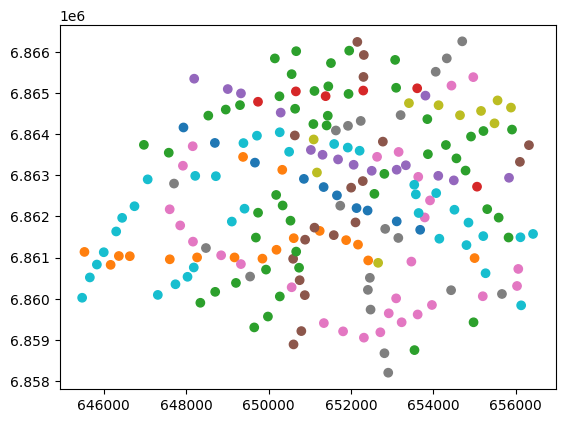

In [79]:
# Ne garder que les arrêts de métro de Paris (méthode Intersection)

Metros = ArretsTC[(ArretsTC["mode"] == 'METRO')]
MetrosIntersect = gpd.overlay(Metros, IRIS, how='intersection')
MetrosIntersect.plot(column='res_com')
MetrosIntersect.head()

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terrer,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry
114,"{'lon': 2.4023331659174434, 'lat': 48.83711700...",108071,Michel Bizot,None,None,71595,Michel Bizot,44140,Michel Bizot,A01541,...,0,0,0,0,RATP,1,0,656130.9690,6.859840e+06,POINT (656130.969 6859839.919)
709,"{'lon': 2.3585513482022034, 'lat': 48.82218265...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540,...,0,0,0,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652903.941 6858204.603)
126,"{'lon': 2.3572456507586854, 'lat': 48.82642600...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,0,0,0,RATP,1,0,652811.9180,6.858677e+06,POINT (652811.918 6858677.193)
845,"{'lon': 2.3504148706484034, 'lat': 48.82979051...",106051,Corvisart,None,None,71013,Corvisart,45274,Corvisart,A01539,...,0,0,0,0,RATP,1,0,652313.5222,6.859055e+06,POINT (652313.522 6859055.391)
108,"{'lon': 2.3558348979655515, 'lat': 48.83099530...",105081,Place d'Italie,None,None,71033,Place d'Italie - Italie 2,44371,Place d'Italie,A01538 / A01539 / A01540,...,0,1,0,0,RATP,1,0,652712.4940,6.859186e+06,POINT (652712.494 6859186.090)


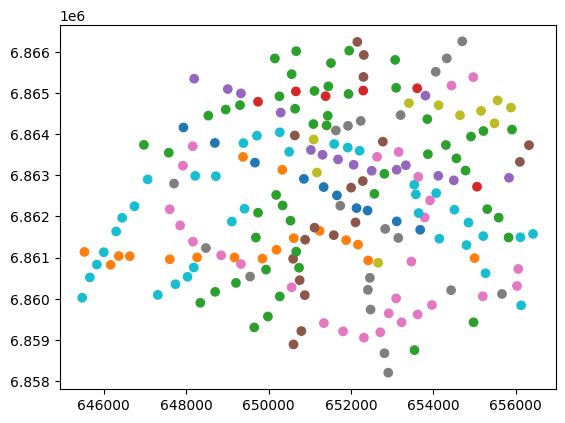

In [81]:
# Ne garder que les arrêts de métro de Paris (méthode Clip)

MetrosClip = Metros.clip(IRIS, keep_geom_type=False)
MetrosClip.plot(column='res_com')
MetrosClip.head()

<Axes: >

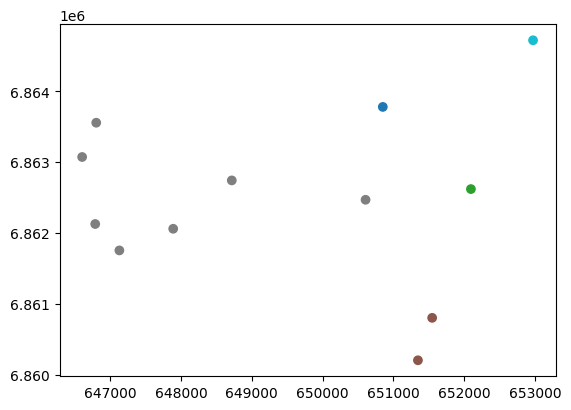

In [50]:
# Ne garder que les arrêts de RER de Paris

RER = ArretsTC[(ArretsTC["mode"] == 'RER')]
RER = gpd.overlay(RER, IRIS, how='intersection')
RER.plot(column='res_com')

## Fonctions de regroupement

https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.dissolve.html

<Axes: >

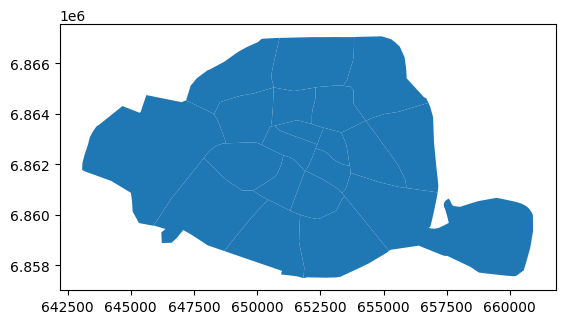

In [75]:
ARDT = IRIS.dissolve(by='insee_com')
ARDT.plot()

## Analyses de recouvrement

Documentation : https://geopandas.org/en/stable/docs/reference/api/geopandas.overlay.html

,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terrer,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry
114,"{'lon': 2.4023331659174434, 'lat': 48.83711700...",108071,Michel Bizot,None,None,71595,Michel Bizot,44140,Michel Bizot,A01541,...,0,0,0,0,RATP,1,0,656130.9690,6.859840e+06,"POLYGON ((656430.969 6859839.919, 656429.524 6..."
709,"{'lon': 2.3585513482022034, 'lat': 48.82218265...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540,...,0,0,0,0,RATP,1,0,652903.9414,6.858205e+06,"POLYGON ((653203.941 6858204.603, 653202.497 6..."
126,"{'lon': 2.3572456507586854, 'lat': 48.82642600...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,0,0,0,RATP,1,0,652811.9180,6.858677e+06,"POLYGON ((653111.918 6858677.193, 653110.473 6..."


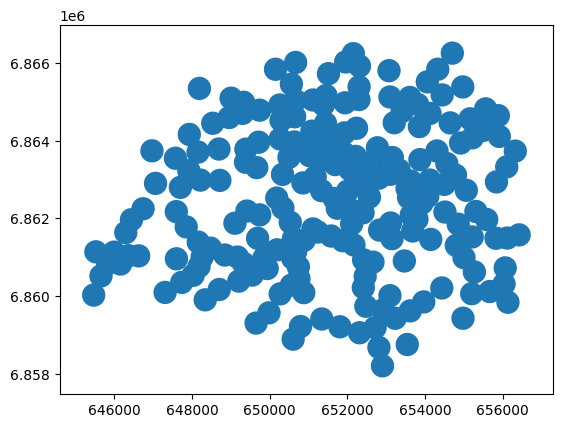

In [82]:
# Buffer de 300m autour des métros

Metrosbuffer = MetrosClip.copy()
Metrosbuffer['geometry'] = Metrosbuffer.geometry.buffer(300)
Metrosbuffer.plot()
Metrosbuffer.head(3)

,geometry
0,"MULTIPOLYGON (((648575.124 6859711.825, 648555..."


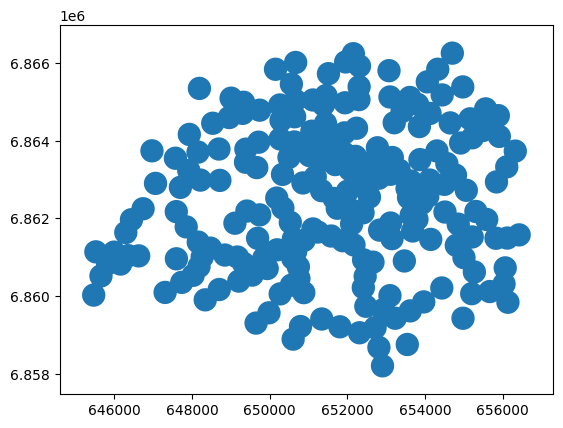

In [83]:
#Grouper les buffers dans une seule entité spatiale
grouped_polygon = Metrosbuffer.unary_union
Buffergrouped = gpd.GeoDataFrame(geometry=[grouped_polygon], crs=Metrosbuffer.crs)
Buffergrouped.plot()
Buffergrouped.head()

<Axes: >

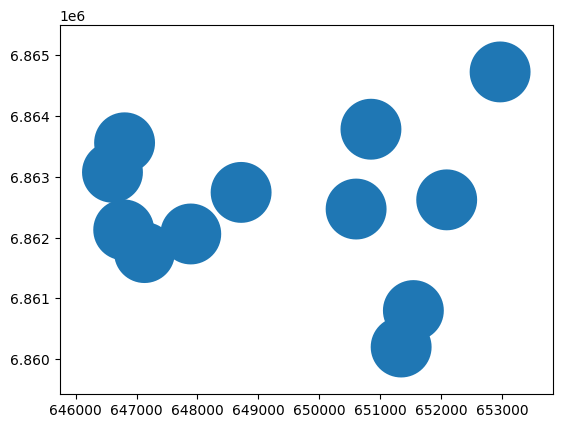

In [84]:
# Buffer de 500m autour des RER

RERbuffer = RER.copy()
RERbuffer['geometry'] = RERbuffer.geometry.buffer(500)
RERbuffer.plot()

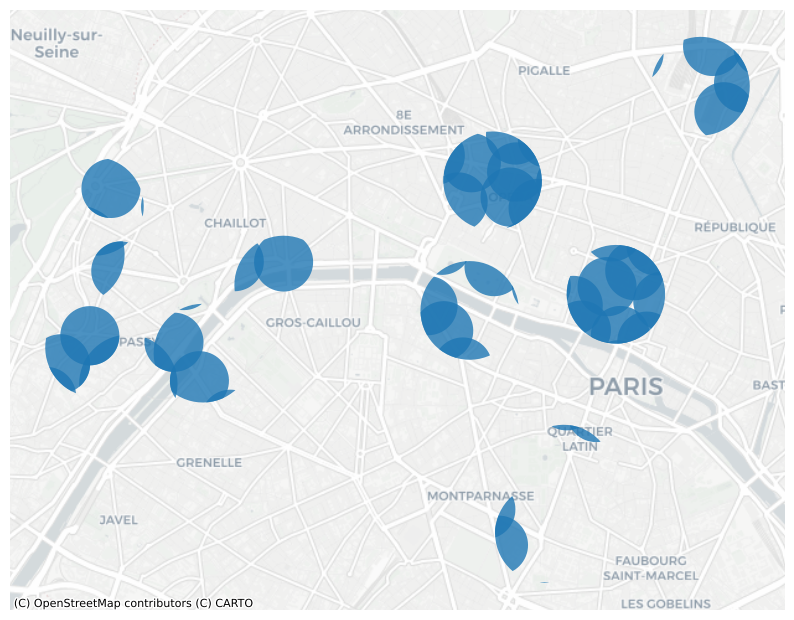

In [86]:
# INTERSECTION des zones à moins de 500m d'une station de RER et à moins de 300m d'une station de métro

Intersect = gpd.overlay(RERbuffer, Metrosbuffer, how='intersection')
MapIntersect, ax = plt.subplots(figsize=(10,10))
Intersect.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8,)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

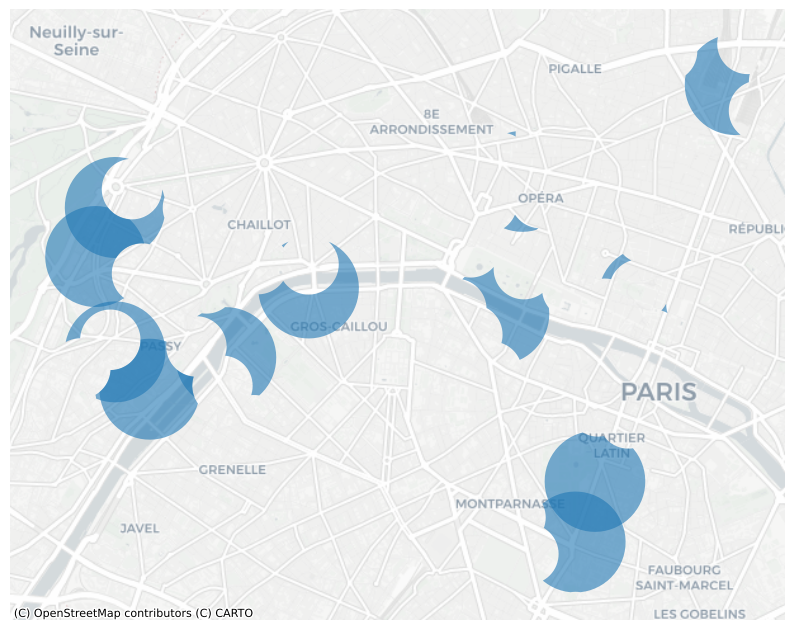

In [87]:
# DIFFERENCE des zones situées à moins de 500m d'un métro mais à plus de 300m d'un métro

Difference = gpd.overlay(RERbuffer, Metrosbuffer, how='difference')

MapDifference, ax = plt.subplots(figsize=(10,10))
Difference.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

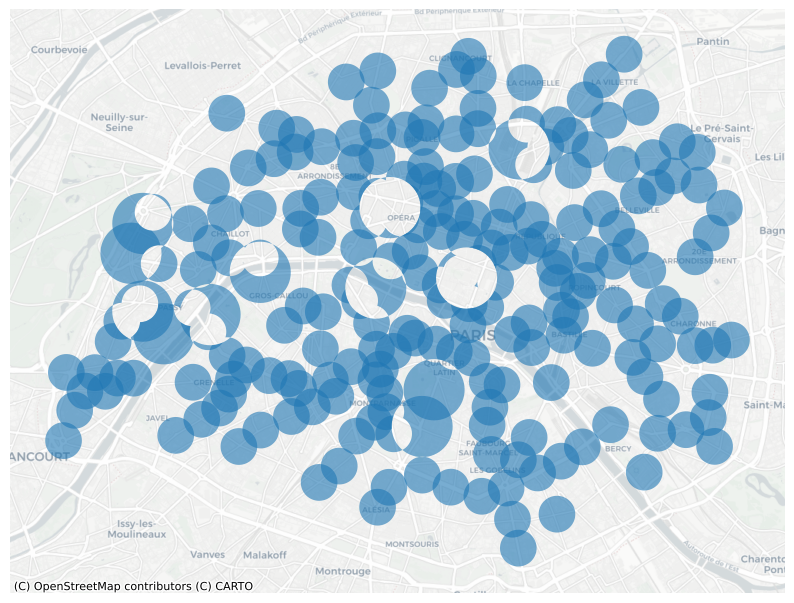

In [94]:
# Différenciation symétrique

DifferenceSymetrique = gpd.overlay(Metrosbuffer, RERbuffer, how='symmetric_difference')

carte, ax = plt.subplots(figsize=(10,10))
DifferenceSymetrique.to_crs('EPSG:3857').plot(ax=ax, alpha=0.6,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

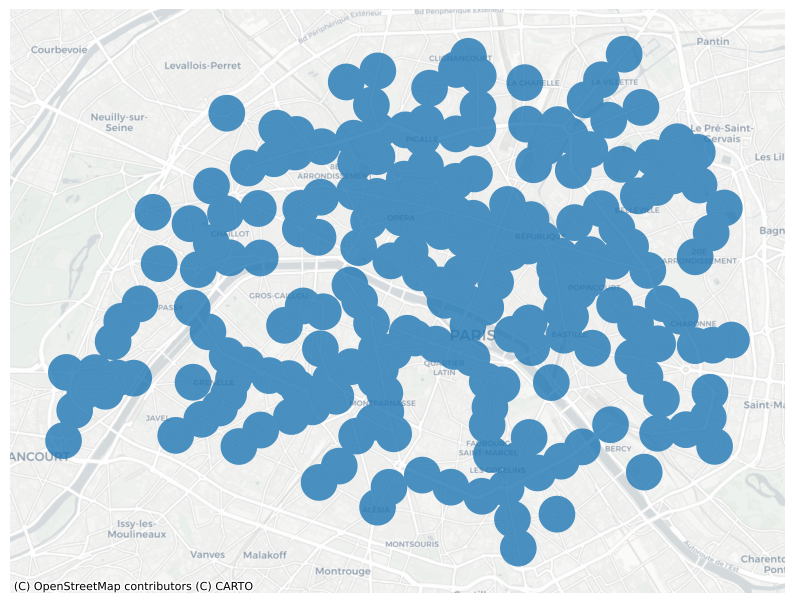

In [90]:
# UNION des zones tampons des métros et des RER

Union = gpd.overlay(Metrosbuffer, RERbuffer, how='union')
grouped_Union = Union.unary_union
Buffergrouped = gpd.GeoDataFrame(geometry=[grouped_polygon], crs=Metrosbuffer.crs)

MapUnion, ax = plt.subplots(figsize=(10,10))
Buffergrouped.to_crs('EPSG:3857').plot(ax=ax, alpha=0.8,)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

# 🎆 Analyse du plus proche voisin

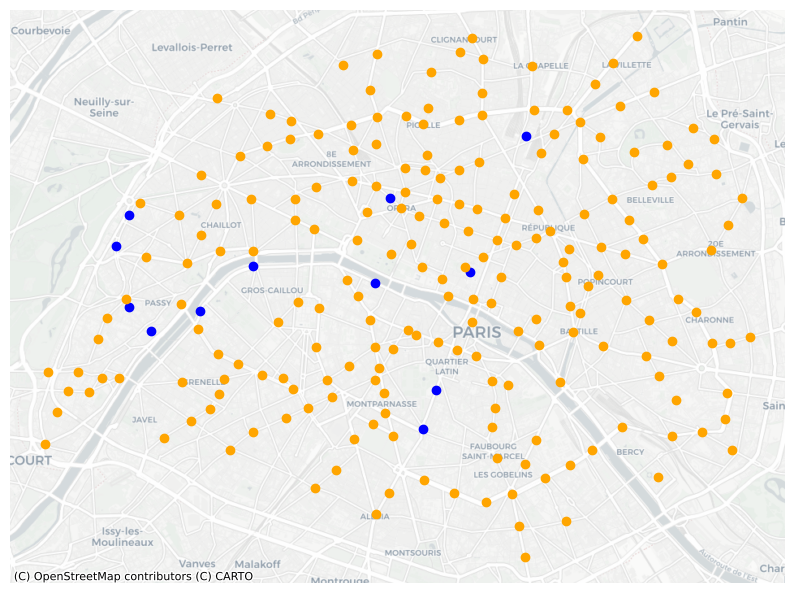

In [99]:
# Affichage des stations de RER et de métro

Metros=MetrosClip

TC, ax = plt.subplots(figsize=(10,10))
RER.to_crs('EPSG:3857').plot(ax=ax, color="blue")
Metros.to_crs('EPSG:3857').plot(ax=ax, color= "orange")
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.show()

In [100]:
#Calcul des distances entre les arrêts de RER et les stations de métros

from shapely.geometry import Point, MultiPoint
from shapely.ops import nearest_points

def get_nearest_values(row, other_gdf, point_column='geometry', value_column="geometry"):

    # Create an union of the other GeoDataFrame's geometries:
    other_points = other_gdf["geometry"].unary_union

    # Find the nearest points
    nearest_geoms = nearest_points(row[point_column], other_points)

    # Get corresponding values from the other df
    nearest_data = other_gdf.loc[other_gdf["geometry"] == nearest_geoms[1]]

    nearest_value = nearest_data[value_column].values[0]

    return nearest_value

In [101]:
#Union des RER

unary_union = RER.unary_union
print(unary_union)

MULTIPOINT (646605.4493990284 6863071.827694577, 646789.9999990317 6862125.999894574, 646804.2191990319 6863555.73869458, 647131.0083990386 6861753.257094569, 647890.7858990484 6862058.750594573, 648717.6548990662 6862741.393094575, 650605.999999101 6862467.999894575, 650849.518699109 6863778.762494583, 651345.3911991133 6860202.455394561, 651546.1124991153 6860801.280494564, 652093.2251991255 6862619.066394577, 652970.1853991456 6864719.449594591)


In [102]:
#Ajouter une colonne avec les coordonnées de la gare RER la plus proche

Metros["nearest_loc"] = Metros.apply(get_nearest_values, other_gdf=RER, axis=1)
Metros.head(2)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,termetro,tertram,terval,exploitant,idf,principal,x,y,geometry,nearest_loc
114,"{'lon': 2.4023331659174434, 'lat': 48.83711700...",108071,Michel Bizot,None,None,71595,Michel Bizot,44140,Michel Bizot,A01541,...,0,0,0,RATP,1,0,656130.9690,6.859840e+06,POINT (656130.969 6859839.919),POINT (651546.112 6860801.280)
709,"{'lon': 2.3585513482022034, 'lat': 48.82218265...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540,...,0,0,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652903.941 6858204.603),POINT (651345.391 6860202.455)


In [103]:
#Ajouter une colonne avec le nom de la gare RER la plus proche

Metros["nearest_stations"] = Metros.apply(get_nearest_values, other_gdf=RER, value_column="nom_long", axis=1)
Metros.head(2)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,tertram,terval,exploitant,idf,principal,x,y,geometry,nearest_loc,nearest_stations
114,"{'lon': 2.4023331659174434, 'lat': 48.83711700...",108071,Michel Bizot,None,None,71595,Michel Bizot,44140,Michel Bizot,A01541,...,0,0,RATP,1,0,656130.9690,6.859840e+06,POINT (656130.969 6859839.919),POINT (651546.112 6860801.280),Luxembourg
709,"{'lon': 2.3585513482022034, 'lat': 48.82218265...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540,...,0,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652903.941 6858204.603),POINT (651345.391 6860202.455),Port Royal


In [104]:
# Créer une nouvelle colonne de géométrie à partir des couples de coordonnées

from shapely.geometry import LineString

Metros['line'] = Metros.apply(lambda row: LineString([row['geometry'], row['nearest_loc']]), axis=1)# Create Line Geodataframe
line_gdf = Metros[["nom_long", "nearest_stations", "line"]].set_geometry('line')# Set the Coordinate reference
line_gdf.crs = crs={"init":"epsg:2154"}
Metros.head(3)

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terval,exploitant,idf,principal,x,y,geometry,nearest_loc,nearest_stations,line
114,"{'lon': 2.4023331659174434, 'lat': 48.83711700...",108071,Michel Bizot,None,None,71595,Michel Bizot,44140,Michel Bizot,A01541,...,0,RATP,1,0,656130.9690,6.859840e+06,POINT (656130.969 6859839.919),POINT (651546.112 6860801.280),Luxembourg,"LINESTRING (656130.969 6859839.919, 651546.112..."
709,"{'lon': 2.3585513482022034, 'lat': 48.82218265...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540,...,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652903.941 6858204.603),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652903.941 6858204.603, 651345.391..."
126,"{'lon': 2.3572456507586854, 'lat': 48.82642600...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,RATP,1,0,652811.9180,6.858677e+06,POINT (652811.918 6858677.193),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652811.918 6858677.193, 651345.391..."


,geo_point_2d,codeunique,nom_long,nom_so_gar,nom_su_gar,id_ref_zdc,nom_zdc,id_ref_zda,nom_zda,idrefliga,...,terval,exploitant,idf,principal,x,y,geometry,nearest_loc,nearest_stations,line
114,"{'lon': 2.4023331659174434, 'lat': 48.83711700...",108071,Michel Bizot,None,None,71595,Michel Bizot,44140,Michel Bizot,A01541,...,0,RATP,1,0,656130.9690,6.859840e+06,POINT (656130.969 6859839.919),POINT (651546.112 6860801.280),Luxembourg,"LINESTRING (656130.969 6859839.919, 651546.112..."
709,"{'lon': 2.3585513482022034, 'lat': 48.82218265...",107081,Maison Blanche,None,None,70645,Maison Blanche,44057,Maison Blanche,A01540,...,0,RATP,1,0,652903.9414,6.858205e+06,POINT (652903.941 6858204.603),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652903.941 6858204.603, 651345.391..."
126,"{'lon': 2.3572456507586854, 'lat': 48.82642600...",107079,Tolbiac,None,None,71001,Tolbiac,43411,Tolbiac,A01540,...,0,RATP,1,0,652811.9180,6.858677e+06,POINT (652811.918 6858677.193),POINT (651345.391 6860202.455),Port Royal,"LINESTRING (652811.918 6858677.193, 651345.391..."


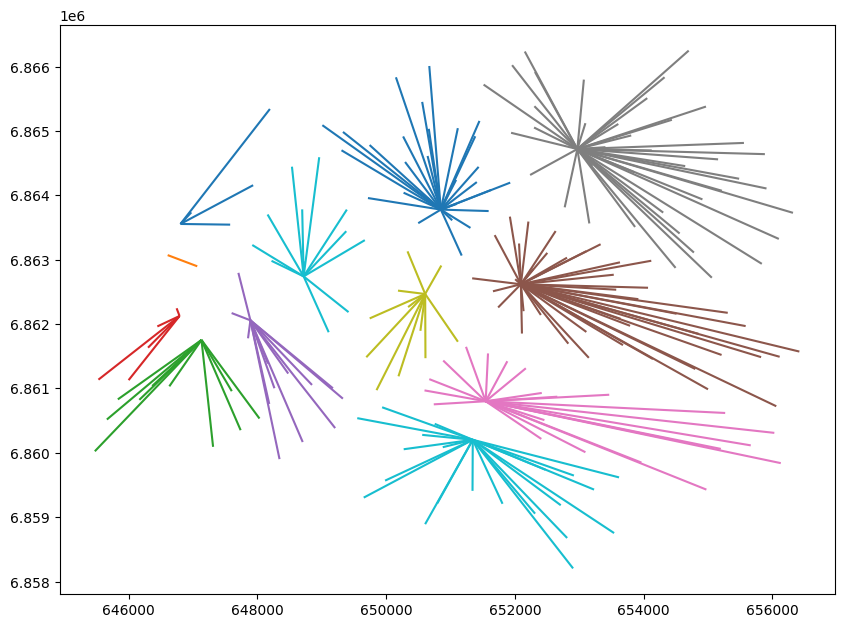

In [105]:
#Générer une nouvelle couche de lignes

LinkMetroRer = Metros.copy()
LinkMetroRer = LinkMetroRer.set_geometry('line', crs=2154)
LinkMetroRer.plot(figsize =(10,10), column = 'nearest_stations')
LinkMetroRer.head(3)

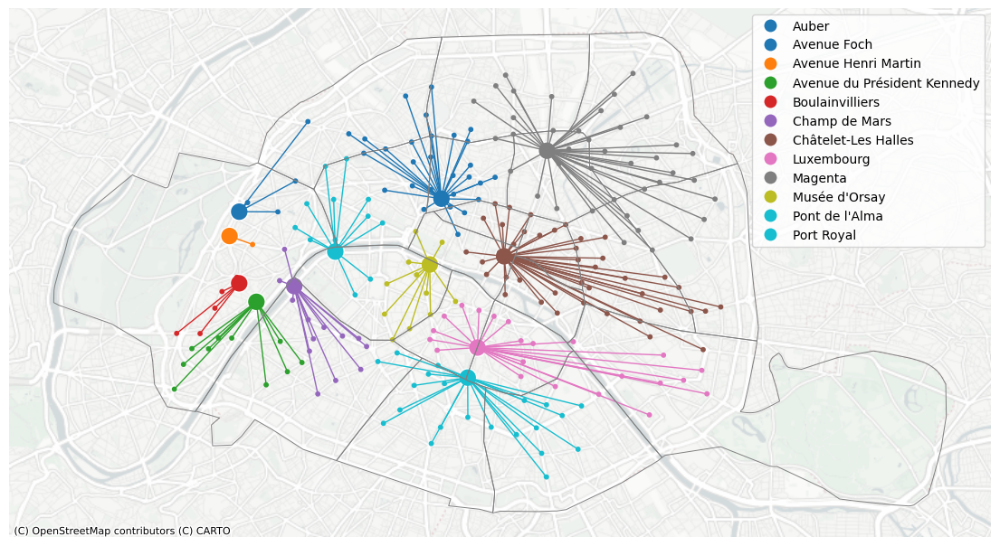

In [108]:
#Faire une carte

Carteflux1, ax = plt.subplots(figsize=(14,14))

RER.to_crs('EPSG:3857').plot(ax=ax, markersize = 200, column = 'nom_long', edgecolor = "white", legend = True)
Metros.to_crs('EPSG:3857').plot(ax=ax, markersize = 10, column = 'nearest_stations')
LinkMetroRer.to_crs('EPSG:3857').plot(ax=ax, column = 'nearest_stations', linewidth=1)

ARDT.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.7, color = 'grey')
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.show()

# 🏡 Applicatif d'indicateurs urbanistiques à l'échelle d'une commune

## Importation des données via cadastre.data.gouv.fr

https://cadastre.data.gouv.fr/datasets/cadastre-etalab

* Nous travaillons ici sur la commune de Cesson Sévigné (code insee 35051)
* Reproduire sur la commune de Bruz (35047)

In [ ]:
#Téléchargement des datas depuis cadastre.data.gouv
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/batiments -O batiments.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/parcelles -O parcelles.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/communes/35051/shp/sections -O sections.zip

,id,commune,prefixe,code,created,updated,geometry
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6..."
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6..."
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6..."


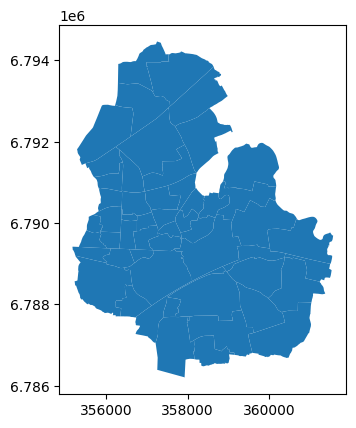

In [363]:
#Chargement couche des Sections cadastrales

Sections= gpd.read_file("sections.zip", encoding='utf-8')
Sections.plot()
Sections.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6..."
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6..."
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2022-01-28,"POLYGON ((357515.617 6790355.263, 357541.619 6..."


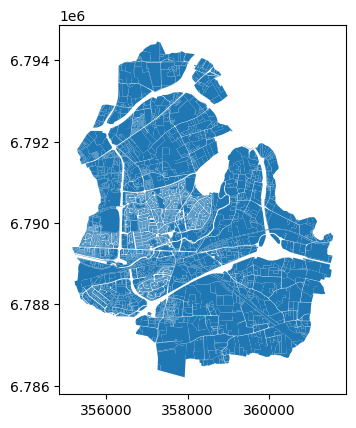

In [364]:
#Chargement couche des Parcelles

Parcelles= gpd.read_file("parcelles.zip", encoding='utf-8')
Parcelles.plot()
Parcelles.head(3)

In [365]:
#Compter le nombre de parcelles
len(Parcelles)

9162

,commune,nom,type,created,updated,geometry
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


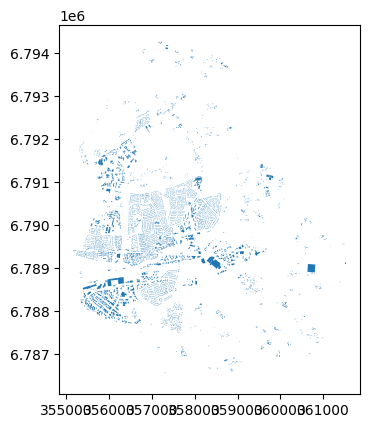

In [366]:
#Chargement couche des Batiments

Batiments= gpd.read_file("batiments.zip", encoding='utf-8')
Batiments.plot()
Batiments.head(3)

In [367]:
#Compter le nombre de batiments
len(Batiments)

9044

## Importation des données via l'API du GPU

https://apicarto.ign.fr/api/doc/gpu

In [ ]:
#Importer le PLU de Rennes Métropole via l'API du GPU
!wget -O PLU.geojson https://apicarto.ign.fr/api/gpu/zone-urba?partition=DU_243500139

#Chargement couche du PLU
PLU= gpd.read_file("PLU.geojson", encoding='utf-8')
PLU = PLU.to_crs("EPSG:2154")
PLU.plot()
PLU.head(3)

## Préparation des couches

In [369]:
# Vérifier le SCR des couches

Batiments.crs
Parcelles.crs
Sections.crs
PLU.crs

<Projected CRS: EPSG:2154>
Name: RGF93 v1 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica (France métropolitaine including Corsica).
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993 v1
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [370]:
#Créer un ID unique pour chaque batiment (id unique)

Batiments["ID_Bati"] = Batiments.index
Batiments.head()

,commune,nom,type,created,updated,geometry,ID_Bati
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2
3,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357201.063 6790536.791, 357202.418 6...",3
4,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357170.131 6790496.341, 357177.821 6...",4


In [371]:
# Créer un ID unique pour chaque parcelle (concaténation de deux champs)

Parcelles["ID_Parcelle"] = Parcelles["prefixe"] + "-" + Parcelles["section"] + "-" + Parcelles["numero"]
Parcelles.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2022-01-28,"POLYGON ((357515.617 6790355.263, 357541.619 6...",000-AA-563


In [372]:
# Créer un ID unique pour chaque section (concaténation de deux champs)

Sections["ID_Section"] = Sections["prefixe"] + "-" + Sections["code"]
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6...",000-AA
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC


In [373]:
# Ajouter une colonne surface aux sections cadastrales (entier)

Sections["Surface_Section"] = Sections['geometry'].area
Sections["Surface_Section"] = Sections["Surface_Section"].astype(int)
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6...",000-AA,369064
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503


In [374]:
# Ajouter une colonne surface aux parcelles cadastrales (entier)

Parcelles["Surface_Parcelle"] = Parcelles['geometry'].area
Parcelles["Surface_Parcelle"] = Parcelles["Surface_Parcelle"].astype(int)
Parcelles.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564,23922
2,35051000AA0563,35051,000,AA,563,6378.0,2020-06-16,2022-01-28,"POLYGON ((357515.617 6790355.263, 357541.619 6...",000-AA-563,5647


In [375]:
# Ajouter une colonne surface aux batiments

Batiments["Surface_Batiment"] = Batiments['geometry'].area
Batiments["Surface_Batiment"] = Batiments["Surface_Batiment"].astype(int)
Batiments.head(3)

,commune,nom,type,created,updated,geometry,ID_Bati,Surface_Batiment
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1,92
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2,114


<Axes: >

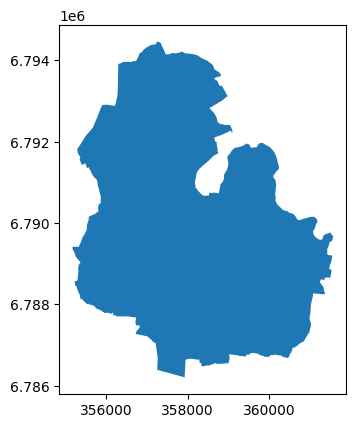

In [376]:
# Créer une couche avec l'emprise de la commune d'étude

Contours = Sections.dissolve(by="commune")
Contours.plot()

<Axes: >

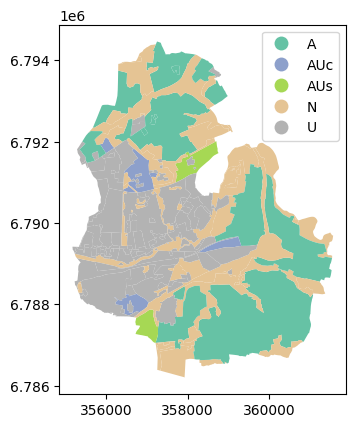

In [377]:
#Ne garder sur le PLU de la commune
PLUCommune = gpd.overlay(PLU, Contours, how='intersection')
PLUCommune.plot(column='typezone', legend=True, cmap='Set2')

## Cartographie du risque d'innondation

### Préparation des couches

In [ ]:
#Téléchargement des datas depuis le portail opendata de Rennes
!wget -O hydrographie.geojson https://data.rennesmetropole.fr/explore/dataset/reseau_hydrographique/download/?format=geojson&timezone=Europe/Berlin&lang=fr

,gml_id,hydro_code_insee,deno_hydro_id,objectid,type_hydro_id,type_hydro_nom,deno_hydr_nom,ope_id,hydro_date_maj,hydro_visible,geometry
0,v_hydro.4316,35251.0,1.0,4316,2,étang,None,1.0,NaT,1,"POLYGON ((350425.354 6795556.393, 350418.988 6..."
1,v_hydro.4389,35238.0,1.0,4389,2,étang,None,1.0,NaT,1,"POLYGON ((346537.151 6785536.366, 346539.792 6..."
2,v_hydro.30,35017.0,1.0,30,2,étang,None,1.0,NaT,1,"POLYGON ((361997.606 6791867.351, 361984.405 6..."


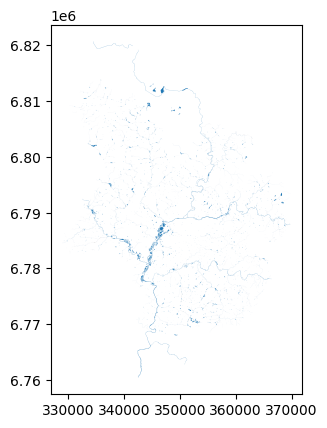

In [379]:
#Chargement couche hydrographie

Hydrographie= gpd.read_file("hydrographie.geojson", encoding='utf-8')
Hydrographie = Hydrographie.to_crs("EPSG:2154")
Hydrographie.plot()
Hydrographie.head(3)

<Axes: >

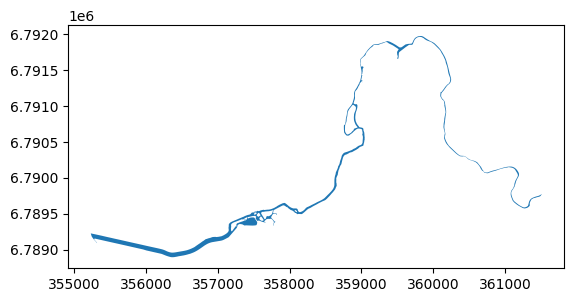

In [380]:
# Ne garder que les troncons de type "fleuve" dans la commune d'étude

Fleuve = Hydrographie[(Hydrographie["type_hydro_nom"] == 'fleuve')]
Hydrocommunetrace = gpd.overlay(Fleuve, Contours, how='intersection')
Hydrocommunetrace.plot()

<Axes: >

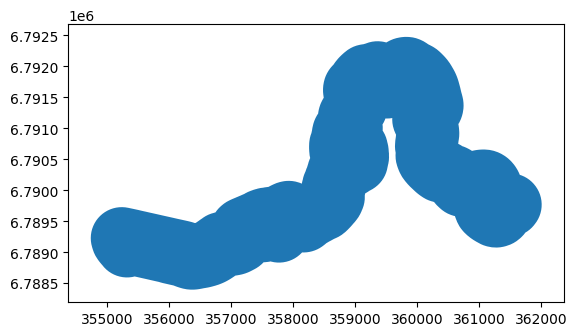

In [381]:
#Faire un buffer de 500m autour de la couche hydro
Hydrocommune = Hydrocommunetrace.copy()
Hydrocommune['geometry'] = Hydrocommune['geometry'].buffer(500)
Hydrocommune = Hydrocommune.dissolve(by ='deno_hydr_nom')
Hydrocommune.plot()

<Axes: >

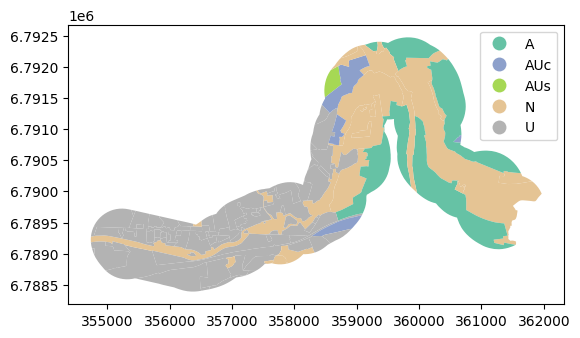

In [382]:
# Garder le zonage situés à moins de 500m de la Vilaine
Zonagerisque = gpd.overlay(PLU, Hydrocommune, how='intersection')
Zonagerisque.plot(column = 'typezone', legend = True, cmap='Set2')

<Axes: >

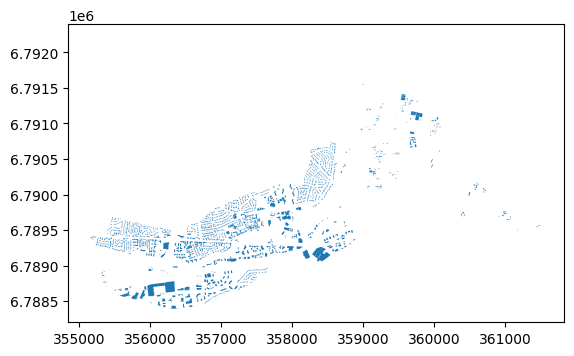

In [383]:
# Garder les bâtiments situés à moins de 500m de la Vilaine

Batirisque = gpd.overlay(Batiments, Hydrocommune, how='intersection')
Batirisque.plot()

### Cartographie

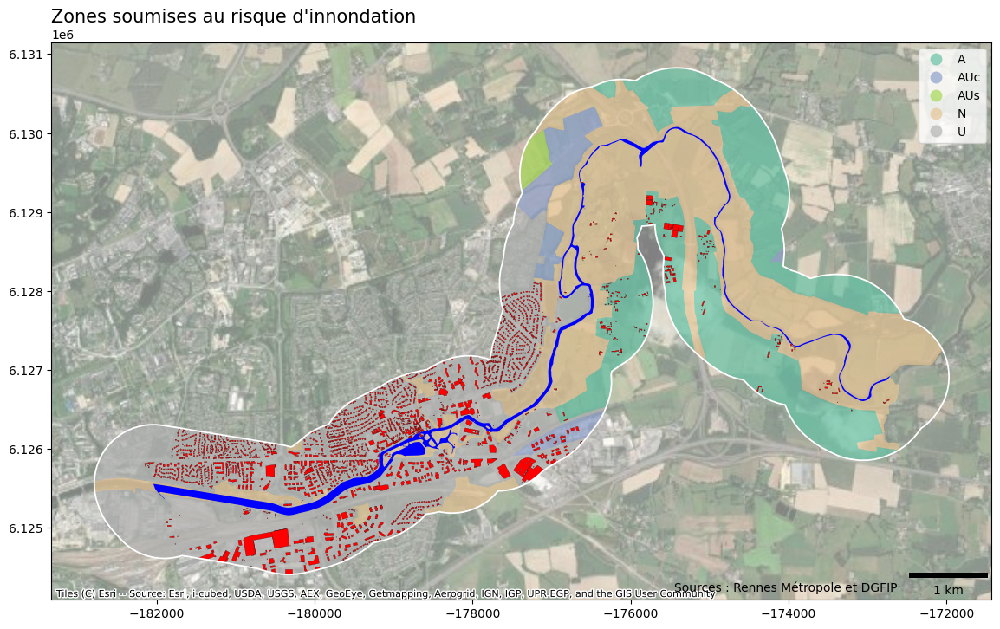

In [384]:
#Carte récapitulative

Carte1, ax = plt.subplots(figsize=(14,14))
Hydrocommune.boundary.to_crs('EPSG:3857').plot(ax=ax, edgecolor="white", linewidth=1.3)
Zonagerisque.to_crs('EPSG:3857').plot(ax = ax, column = 'typezone', legend = True, alpha=0.7, cmap='Set2')
Batirisque.to_crs('EPSG:3857').plot(ax=ax, color="red", edgecolor="black", linewidth=0.15)
Hydrocommunetrace.to_crs('EPSG:3857').plot(ax=ax, color="blue",linewidth=5)

ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery, alpha=0.5)

plt.title("Zones soumises au risque d'innondation", loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : Rennes Métropole et DGFIP', verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location="lower right", box_alpha=0, color="black"))

plt.show()

## Analyse spatiale

*   Compter le nombre de bâtiments par section cadastrale
*   Compter le nombre de bâtiments par parcelle cadastrale
*   Calculer la proportion de surface des bâtiments par parcelle cadastrale
*   Compter le nombre de parcelles par type de zonage
*   Compter le nombre de bâtiments par type de zonage

### Compter le nombre de bâtiments par section cadastrale


<Axes: >

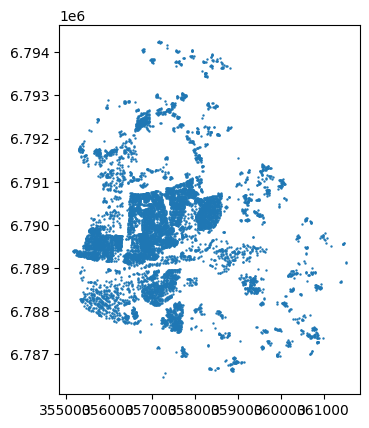

In [385]:
#Transformer les batiments (polygones) en points (centroides)

BatimentsCentro = Batiments.copy()
BatimentsCentro.geometry = BatimentsCentro['geometry'].centroid
BatimentsCentro.plot( markersize=0.5, legend=True)

In [386]:
# Encrichir les batiments des informations de la couche des Sections Cadastrales (jointure spatiale)

BatimentsEtape1 = gpd.sjoin(BatimentsCentro, Sections)
BatimentsEtape1.head(5)

,commune_left,nom,type,created_left,updated_left,geometry,ID_Bati,Surface_Batiment,index_right,id,commune_right,prefixe,code,created_right,updated_right,ID_Section,Surface_Section
0,35051,None,01,2020-06-16,2020-06-22,POINT (357214.927 6790493.368),0,100,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
1,35051,None,01,2020-06-16,2020-06-22,POINT (357186.831 6790466.391),1,92,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
2,35051,None,01,2020-06-16,2020-06-22,POINT (357216.900 6790398.322),2,114,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
3,35051,None,01,2020-06-16,2020-06-22,POINT (357196.770 6790531.821),3,139,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064
4,35051,None,01,2020-06-16,2020-06-22,POINT (357176.881 6790496.643),4,107,0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,000-AA,369064


In [387]:
#Réorganiser la table

BatimentsEtape2 = BatimentsEtape1[["ID_Bati", "type", "code", "Surface_Batiment", "ID_Section", "Surface_Section", "geometry"]]
BatimentsEtape2.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,geometry
0,0,01,AA,100,000-AA,369064,POINT (357214.927 6790493.368)
1,1,01,AA,92,000-AA,369064,POINT (357186.831 6790466.391)
2,2,01,AA,114,000-AA,369064,POINT (357216.900 6790398.322)


In [388]:
# Encrichir les batiments des informations de la couche des parcelles Cadastrales (jointure spatiale)

BatimentsEtape3 = gpd.sjoin(BatimentsEtape2, Parcelles)
BatimentsEtape3.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,geometry,index_right,id,commune,prefixe,section,numero,contenance,created,updated,ID_Parcelle,Surface_Parcelle
0,0,01,AA,100,000-AA,369064,POINT (357214.927 6790493.368),15,35051000AA0126,35051,000,AA,126,580.0,2020-06-16,2022-01-28,000-AA-126,584
1,1,01,AA,92,000-AA,369064,POINT (357186.831 6790466.391),14,35051000AA0124,35051,000,AA,124,468.0,2020-06-16,2022-01-28,000-AA-124,470
2,2,01,AA,114,000-AA,369064,POINT (357216.900 6790398.322),22,35051000AA0119,35051,000,AA,119,513.0,2020-06-16,2022-01-28,000-AA-119,511


In [389]:
#Réorganiser la table

BatimentsFinal = BatimentsEtape3[["ID_Bati", "type", "code", "Surface_Batiment", "ID_Section", "Surface_Section", "ID_Parcelle", "Surface_Parcelle", "geometry"]]
BatimentsFinal.head(3)

,ID_Bati,type,code,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,geometry
0,0,01,AA,100,000-AA,369064,000-AA-126,584,POINT (357214.927 6790493.368)
1,1,01,AA,92,000-AA,369064,000-AA-124,470,POINT (357186.831 6790466.391)
2,2,01,AA,114,000-AA,369064,000-AA-119,511,POINT (357216.900 6790398.322)


In [390]:
# Jointure attributaire pour repasser sur la couche des polygones

BatimentsFinalOk = Batiments.merge(BatimentsFinal, on='ID_Bati')
BatimentsFinalOk.head(3)

,commune,nom,type_x,created,updated,geometry_x,ID_Bati,Surface_Batiment_x,type_y,code,Surface_Batiment_y,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,geometry_y
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100,01,AA,100,000-AA,369064,000-AA-126,584,POINT (357214.927 6790493.368)
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1,92,01,AA,92,000-AA,369064,000-AA-124,470,POINT (357186.831 6790466.391)
2,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357208.471 6790399.177, 357213.178 6...",2,114,01,AA,114,000-AA,369064,000-AA-119,511,POINT (357216.900 6790398.322)


In [391]:
#Réorganiser la table
BatimentsFinalOk = BatimentsFinalOk[["ID_Bati", "type_x", "Surface_Batiment_x", "ID_Section", "Surface_Section", "ID_Parcelle", "Surface_Parcelle", "geometry_x"]]
BatimentsFinalOk.rename(columns={'type_x': 'type','Surface_Batiment_x': 'Surface_Batiment','geometry_x': 'Geometry'}, inplace=True)
BatimentsFinalOk.head()

<ipython-input-391-545e0da0ae41>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  BatimentsFinalOk.rename(columns={'type_x': 'type','Surface_Batiment_x': 'Surface_Batiment','geometry_x': 'Geometry'}, inplace=True)


,ID_Bati,type,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,Geometry
0,0,01,100,000-AA,369064,000-AA-126,584,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,1,01,92,000-AA,369064,000-AA-124,470,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,2,01,114,000-AA,369064,000-AA-119,511,"POLYGON ((357208.471 6790399.177, 357213.178 6..."
3,3,01,139,000-AA,369064,000-AA-78,669,"POLYGON ((357201.063 6790536.791, 357202.418 6..."
4,4,01,107,000-AA,369064,000-AA-82,577,"POLYGON ((357170.131 6790496.341, 357177.821 6..."


,ID_Bati,type,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,Geometry
0,0,01,100,000-AA,369064,000-AA-126,584,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,1,01,92,000-AA,369064,000-AA-124,470,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,2,01,114,000-AA,369064,000-AA-119,511,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


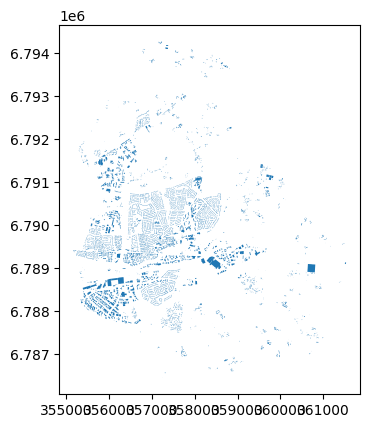

In [392]:
#Repasser en GeoDataframe

BatiOK = gpd.GeoDataFrame(BatimentsFinalOk, crs="EPSG:2154", geometry='Geometry')
BatiOK.plot()
BatiOK.head(3)

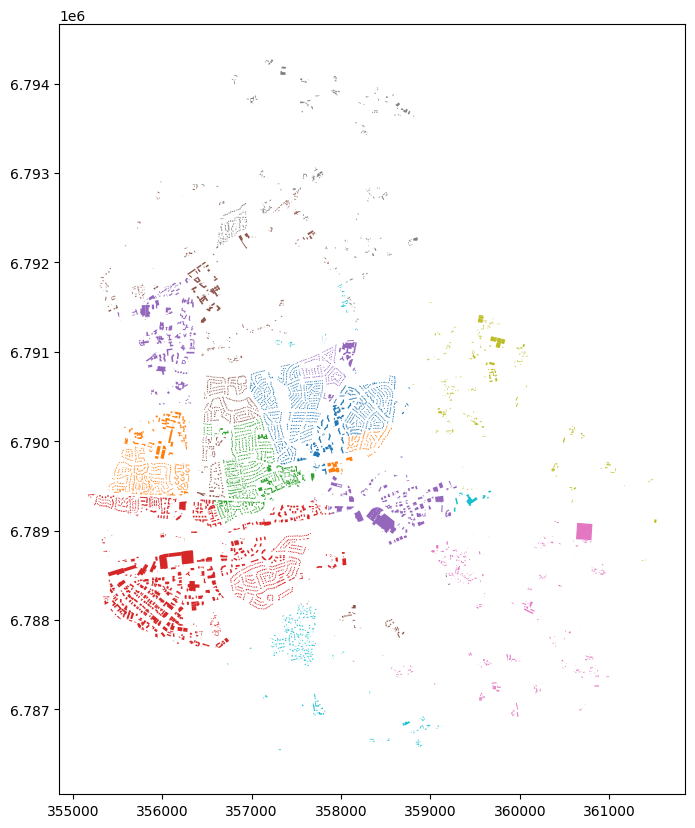

In [393]:
# Faire une carte des batiments catégorisée par code de section

map2 = BatiOK.plot(figsize=(10,10), column='ID_Section', legend=False).get_figure()

In [394]:
# Calculer le  nombre de batiments par sections cadastrale

NbBatiSection = BatiOK[["ID_Section", "ID_Bati"]].groupby("ID_Section").size()
NbBatiSection = pd.DataFrame(NbBatiSection)
NbBatiSection = NbBatiSection.rename(columns={0: 'NbBatis'})
NbBatiSection.head(3)

,NbBatis
ID_Section,
000-AA,475
000-AB,263
000-AC,112


In [395]:
# Compter le nombre de batiment (vérification)

total1 = Batiments['geometry'].count()
total2 = NbBatiSection['NbBatis'].sum()
print(total1)
print(total1)

9044
9044


In [396]:
# Jointure attributaire pour repasser sur la couche des sections cadastrales

Sections = Sections.merge(NbBatiSection, on='ID_Section')
Sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,ID_Section,Surface_Section,NbBatis
0,35051000AA,35051,000,AA,2020-06-16,2020-06-22,"POLYGON ((357095.719 6790338.898, 357089.990 6...",000-AA,369064,475
1,35051000AB,35051,000,AB,2020-06-16,2020-06-22,"POLYGON ((357603.646 6790021.629, 357544.963 6...",000-AB,214286,263
2,35051000AC,35051,000,AC,2020-06-16,2020-06-22,"POLYGON ((357841.087 6789716.194, 357850.289 6...",000-AC,142503,112


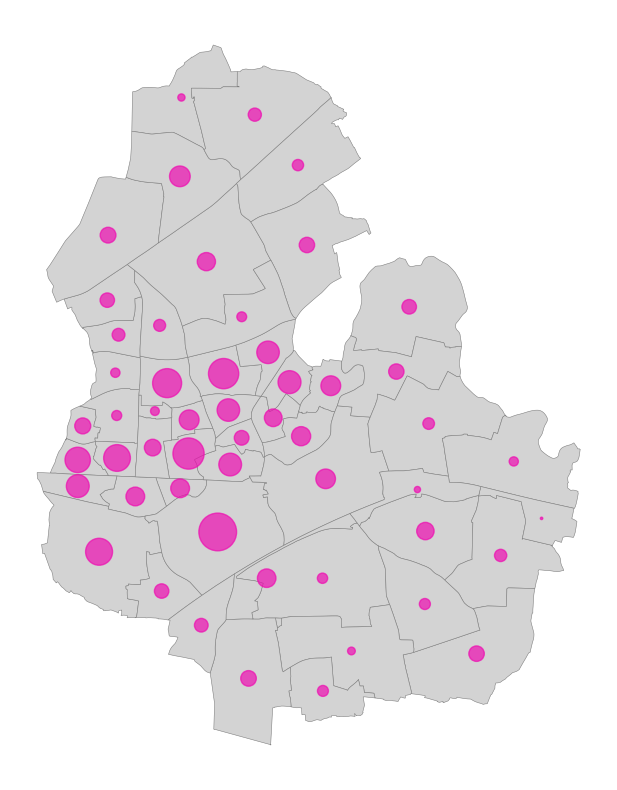

In [397]:
# Faire une carte pour représenter le nombre de batiments pas section cadastrale

SectionsCentro = Sections.copy()
SectionsCentro.geometry = SectionsCentro['geometry'].centroid

Carte1, ax = plt.subplots(figsize=(10,10))  # Configuration de la carte

Sections.plot(ax=ax, color="lightgray", edgecolor="grey", linewidth=0.4)
SectionsCentro.plot(ax=ax,color="#ee0db1", markersize="NbBatis",alpha=0.7, categorical=False, legend=True)

ax.axis("off")
plt.show()

<Axes: ylabel='Frequency'>

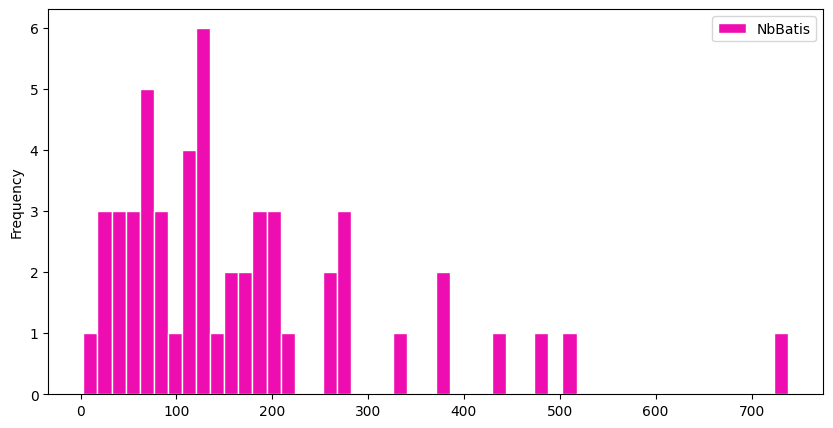

In [398]:
# Histogramme

NbBatiSection.plot.hist(figsize = (10,5), bins=50, color="#ee0db1", edgecolor='white')

### Compter le nombre de bâtiments par parcelle cadastrale

In [399]:
# Calculer le Nombre de batiments par parcelle cadastrale

NbBatiParcelle  = BatiOK[["ID_Parcelle", "ID_Bati"]].groupby("ID_Parcelle").size()
NbBatiParcelle =pd.DataFrame(NbBatiParcelle)
NbBatiParcelle = NbBatiParcelle.rename(columns={0: 'NbBatis'})
NbBatiParcelle.head(5)

,NbBatis
ID_Parcelle,
000-AA-10,2
000-AA-100,1
000-AA-101,1
000-AA-102,1
000-AA-103,1


In [400]:
# Compter le nombre de batiment

total1 = Batiments['geometry'].count()
total2 = NbBatiParcelle['NbBatis'].sum()
print(total1)
print(total1)

9044
9044


In [401]:
# Jointure attributaire pour repasser sur la couche des parcelles  cadastrales

Parcellesbis = Parcelles.merge(NbBatiParcelle, on='ID_Parcelle')
Parcellesbis.head(3)

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle,NbBatis
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589,1
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2022-01-28,"POLYGON ((357526.866 6790865.979, 357527.840 6...",000-AA-192,6609,1
2,35051000AA0059,35051,000,AA,59,619.0,2020-06-16,2022-01-28,"POLYGON ((357024.044 6790482.974, 357016.068 6...",000-AA-59,621,1


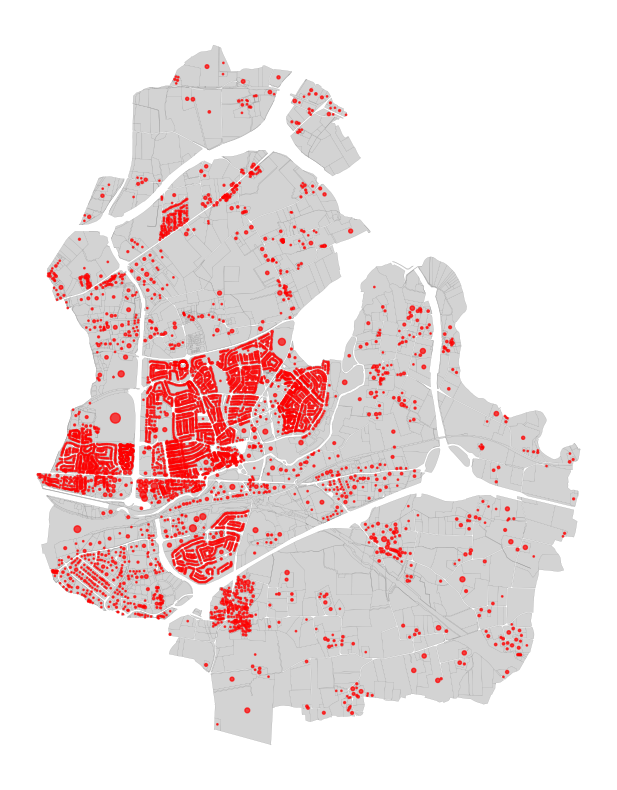

In [402]:
# Faire une carte pour représenter le nombre de batiments par parcelle cadastrale

Parcellescentro = Parcellesbis.copy()
Parcellescentro.geometry = Parcellescentro['geometry'].centroid

Carte1, ax = plt.subplots(figsize=(10,10))  # Configuration de la carte

Parcelles.plot(ax=ax, color="lightgray", edgecolor="grey", linewidth=0.1)
Parcellescentro.plot(ax=ax, markersize="NbBatis", color='red', alpha=0.7, legend=True)

ax.axis("off")
plt.show()

<Axes: ylabel='Frequency'>

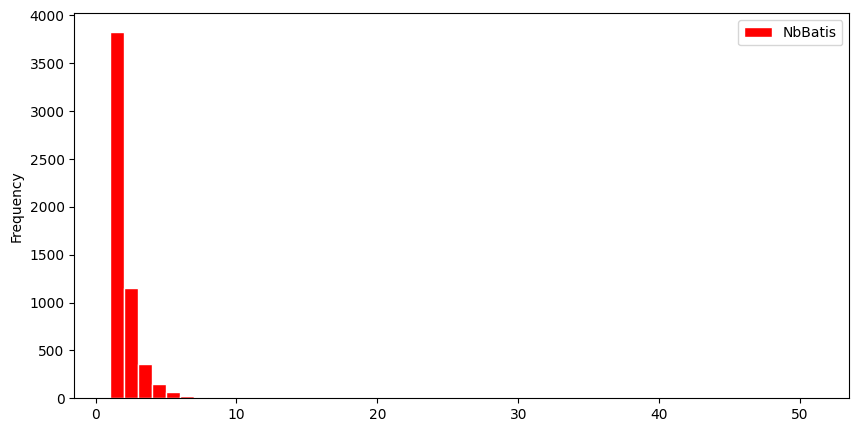

In [403]:
#Histogramme

NbBatiParcelle.plot.hist(figsize = (10,5), bins=50, color='red', edgecolor='white')

### Calculer la proportion de surface des bâtiments par parcelle cadastrale (tx de recouvrement)

In [404]:
BatiOK.head(3)

,ID_Bati,type,Surface_Batiment,ID_Section,Surface_Section,ID_Parcelle,Surface_Parcelle,Geometry
0,0,01,100,000-AA,369064,000-AA-126,584,"POLYGON ((357222.008 6790493.977, 357213.758 6..."
1,1,01,92,000-AA,369064,000-AA-124,470,"POLYGON ((357187.130 6790473.351, 357193.638 6..."
2,2,01,114,000-AA,369064,000-AA-119,511,"POLYGON ((357208.471 6790399.177, 357213.178 6..."


In [405]:
# Calculer la proportion des surfaces baties par parcelle cadastrale

recap = BatiOK.groupby('ID_Parcelle').agg({'Surface_Batiment':'sum','Surface_Parcelle':'max'})
recap["propbatiparcelle"] = recap["Surface_Batiment"] / recap["Surface_Parcelle"] *100
recap.head()

,Surface_Batiment,Surface_Parcelle,propbatiparcelle
ID_Parcelle,,,
000-AA-10,99,796,12.437186
000-AA-100,84,421,19.952494
000-AA-101,139,644,21.583851
000-AA-102,111,528,21.022727
000-AA-103,91,606,15.016502


In [406]:
# Faire la jointure attributaire avec la couche des parcelles cadastrales et la carte

Parcellesok = Parcellesbis.merge(recap, on='ID_Parcelle')
Parcellesok.head()

,id,commune,prefixe,section,numero,contenance,created,updated,geometry,ID_Parcelle,Surface_Parcelle_x,NbBatis,Surface_Batiment,Surface_Parcelle_y,propbatiparcelle
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,42589,1,8,42589,0.018784
1,35051000AA0192,35051,000,AA,192,6752.0,2020-06-16,2022-01-28,"POLYGON ((357526.866 6790865.979, 357527.840 6...",000-AA-192,6609,1,7,6609,0.105916
2,35051000AA0059,35051,000,AA,59,619.0,2020-06-16,2022-01-28,"POLYGON ((357024.044 6790482.974, 357016.068 6...",000-AA-59,621,1,125,621,20.128824
3,35051000AA0553,35051,000,AA,553,1290.0,2020-06-16,2022-01-28,"POLYGON ((357028.302 6790578.606, 357025.147 6...",000-AA-553,1287,2,433,1287,33.644134
4,35051000AA0137,35051,000,AA,137,610.0,2020-06-16,2022-01-28,"POLYGON ((357264.528 6790536.956, 357247.448 6...",000-AA-137,609,1,140,609,22.988506


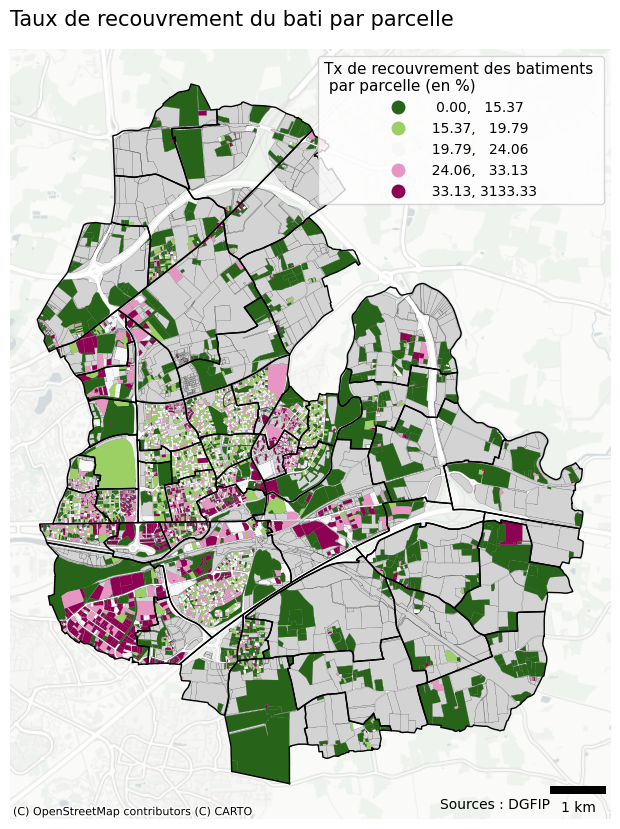

In [407]:
Carte1, ax = plt.subplots(figsize=(10,10))

Sections.to_crs('EPSG:3857').boundary.plot(ax=ax, edgecolor="black", linewidth=1)
Parcelles.to_crs('EPSG:3857').plot(ax=ax, color="lightgray", edgecolor="black", linewidth=0.1)
Parcellesok.to_crs('EPSG:3857').plot(ax=ax, column='propbatiparcelle', cmap='PiYG_r', scheme='quantiles', legend=True,
                                     legend_kwds={'title': "Tx de recouvrement des batiments \n par parcelle (en %)", 'loc': 'upper right', 'title_fontsize': 11, 'fontsize': 10})

ctx.add_basemap(ax, source=ctx.providers.CartoDB.PositronNoLabels)

ax.axis("off")
plt.title('Taux de recouvrement du bati par parcelle', loc='left', fontsize=15)
ax.text(0.90, 0.01, 'Sources : DGFIP', verticalalignment='bottom', horizontalalignment='right', transform=ax.transAxes, color='black', fontsize=10)
ax.add_artist(ScaleBar(1, length_fraction=0.1, location="lower right", box_alpha=0, color="black"))

plt.show()

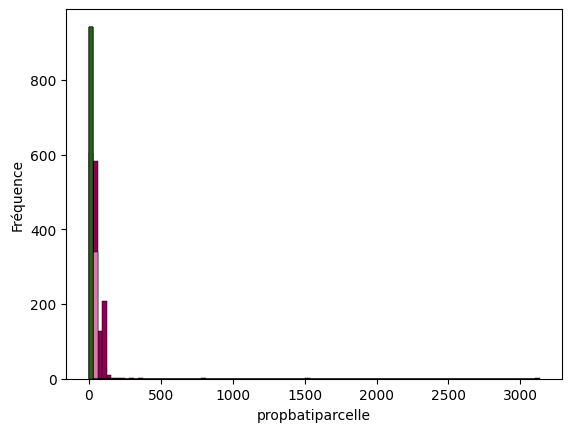

In [408]:
# Histogramme en fonction de la discrétisation de la carte

# Nombre de quantiles
num_quantiles = 6

# Calculer les quantiles
quantiles = pd.qcut(Parcellesok['propbatiparcelle'], num_quantiles, labels=False)

# Tracer l'histogramme avec des couleurs de quantiles en utilisant Seaborn
sns.histplot(data=Parcellesok, x='propbatiparcelle', bins=100, hue=quantiles, palette='PiYG_r',  alpha=1, legend=False)

# Définir les étiquettes des axes
plt.xlabel("propbatiparcelle")
plt.ylabel("Fréquence")

# Afficher le graphe
plt.show()

### Compter le nombre de parcelles par type de zonage

,id,commune,prefixe_left,section,numero,contenance,created_left,updated_left,geometry,ID_Parcelle,...,idurba,idzone,lib_idzone,id_2,prefixe_right,code,created_right,updated_right,ID_Section,Surface_Section
0,35051000AA0562,35051,000,AA,562,42655.0,2020-06-16,2023-03-28,"POLYGON ((357147.131 6790343.595, 357174.713 6...",000-AA-562,...,243500139_PLUI_20230406,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064
1,35051000AA0564,35051,000,AA,564,21375.0,2020-06-16,2023-03-27,"POLYGON ((357023.822 6790674.048, 357025.859 6...",000-AA-564,...,243500139_PLUI_20230406,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064


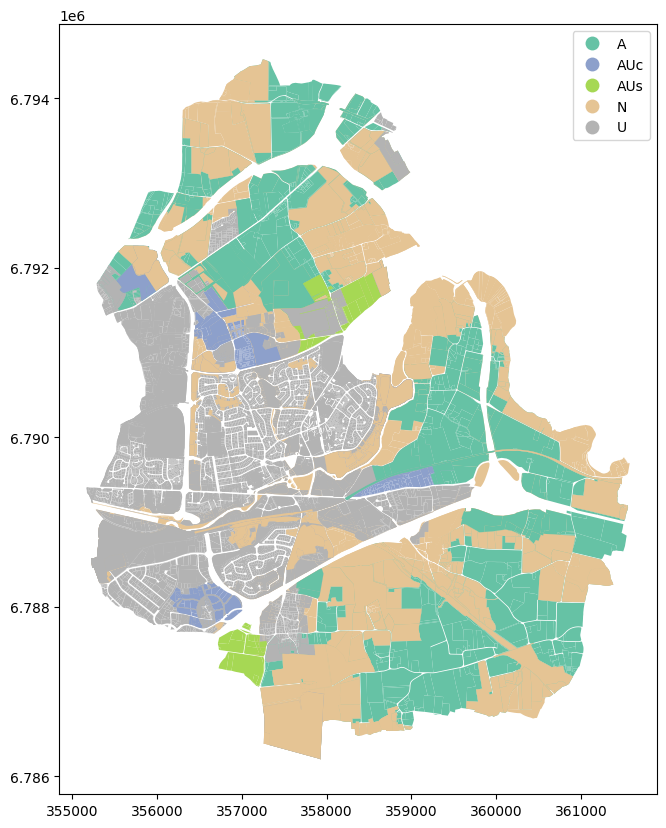

In [409]:
# Encrichir les batiments des informations de la couche PLU (jointure spatiale)

ParcellesPLU = gpd.sjoin(Parcelles, PLUCommune)
ParcellesPLU.plot(figsize=(10,10),column='typezone', legend=True, cmap='Set2')
ParcellesPLU.head(2)

,id
typezone,
A,1306
AUc,436
AUs,89
N,1737
U,8257


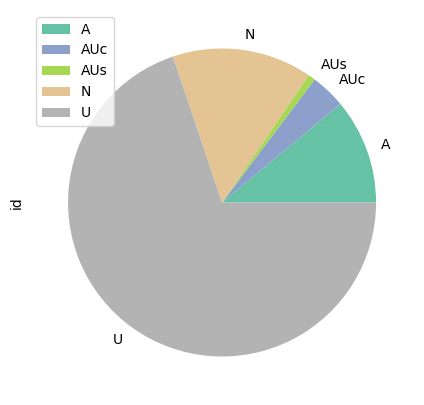

In [410]:
# Graphique du nombre de parcelles par zonage

Categorie = ParcellesPLU[["typezone", "id"]].groupby("typezone").count()
Categorie.plot.pie(figsize =(14,5), y="id", cmap='Set2')
Categorie.head()

### Compter le nombre de bâtiments par type de zonage

,commune,nom,type,created_left,updated_left,geometry,ID_Bati,Surface_Batiment,index_right,id_1,...,idurba,idzone,lib_idzone,id_2,prefixe,code,created_right,updated_right,ID_Section,Surface_Section
0,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357222.008 6790493.977, 357213.758 6...",0,100,56,zone_urba.fid--38c9b77b_18e61f5c402_7b63,...,243500139_PLUI_20230406,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064
1,35051,None,01,2020-06-16,2020-06-22,"POLYGON ((357187.130 6790473.351, 357193.638 6...",1,92,56,zone_urba.fid--38c9b77b_18e61f5c402_7b63,...,243500139_PLUI_20230406,None,None,35051000AA,000,AA,2020-06-16,2020-06-22,000-AA,369064


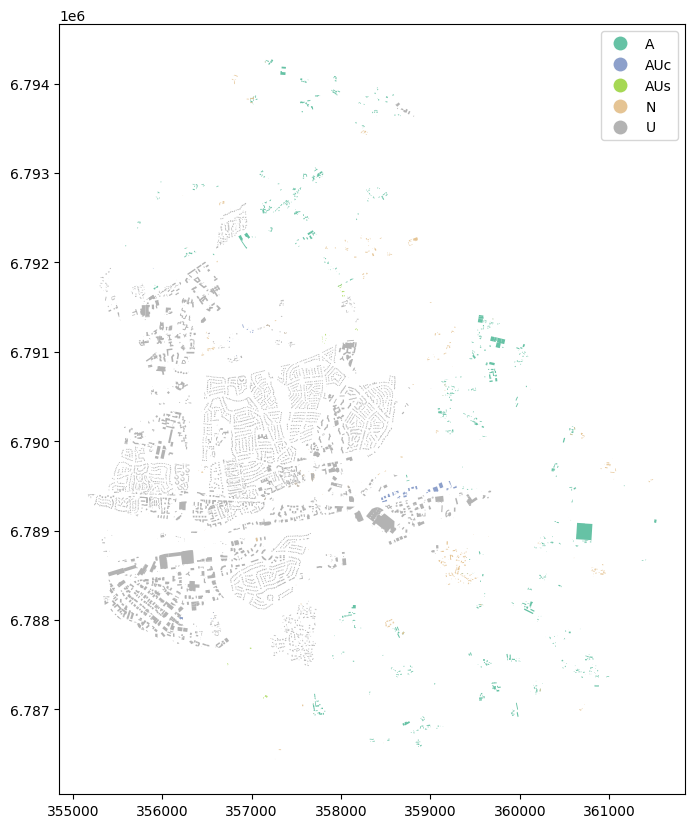

In [411]:
# Encrichir les batiments des informations de la couche PLU (jointure spatiale)

BatimentsPLU = gpd.sjoin(Batiments, PLUCommune)
BatimentsPLU.plot(figsize=(10,10),column='typezone', legend=True, cmap='Set2')
BatimentsPLU.head(2)

,ID_Bati
typezone,
A,1106
AUc,65
AUs,30
N,446
U,7603


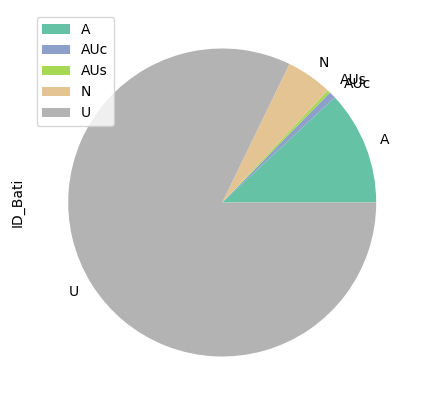

In [412]:
# Graphique du nombre de bâtiments par zonage

Categorie = BatimentsPLU[["typezone", "ID_Bati"]].groupby("typezone").count()
Categorie.plot.pie(figsize =(14,5), y="ID_Bati", cmap='Set2')
Categorie.head()


# 🚀 Applicatif : indicateur d'urbanisation à l'échelle d'un département

### Préparation des données


In [ ]:
#Téléchargement des datas depuis cadastre.data.gouv

!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/batiments -O batiments.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/communes -O communes.zip
!wget https://cadastre.data.gouv.fr/bundler/cadastre-etalab/departements/05/shp/sections -O sections.zip

In [343]:
#Chargement couche batiment (le temps de chargement peut-être long, environ 3mn)
batiments= gpd.read_file("batiments.zip")
batiments.head(3)

,commune,nom,type,created,updated,geometry
0,05003,None,02,2006-11-26,2014-02-14,"POLYGON ((1004394.633 6419015.473, 1004395.489..."
1,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004471.541 6418962.558, 1004471.602..."
2,05003,None,01,2015-01-29,2015-01-29,"POLYGON ((1004472.347 6418979.767, 1004472.941..."


In [344]:
batiments['commune'].count()

168340

In [345]:
#Chargement couche communes
communes= gpd.read_file("communes.zip", encoding='utf-8')
communes.head(3)

,id,nom,created,updated,geometry
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401..."
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6..."
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6..."


In [346]:
len(communes)

162

In [347]:
#Chargement couche sections
sections= gpd.read_file("sections.zip", encoding='utf-8')
sections.head(3)

,id,commune,prefixe,code,created,updated,geometry
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400..."
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177..."
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601..."


In [348]:
len(sections)

1556

In [349]:
# Ajouter des index spatiaux aux couches

batiments.sindex
communes.sindex
sections.sindex

### Exercice à l'échelle des communes


In [350]:
# Calculer la surface des bâtiments

batiments["Surface_batiments"] = batiments['geometry'].area
batiments['Surface_batiments']=batiments['Surface_batiments'].astype(int)
batiments.head()

,commune,nom,type,created,updated,geometry,Surface_batiments
0,05003,None,02,2006-11-26,2014-02-14,"POLYGON ((1004394.633 6419015.473, 1004395.489...",0
1,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004471.541 6418962.558, 1004471.602...",20
2,05003,None,01,2015-01-29,2015-01-29,"POLYGON ((1004472.347 6418979.767, 1004472.941...",43
3,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004532.999 6418976.045, 1004528.888...",47
4,05003,None,01,2006-11-13,2014-02-14,"POLYGON ((1004507.287 6419001.468, 1004511.479...",75


In [351]:
# Calculer la somme des surfaces des bâtiments par commune

SurfaceBatisCommunes = batiments.groupby('commune').agg({'Surface_batiments':'sum'})
SurfaceBatisCommunes.head()

,Surface_batiments
commune,
05001,71846
05003,50215
05004,167786
05006,200459
05007,81251


In [352]:
# Calculer la surface des communes

communes["Surface_commune"] = communes['geometry'].area
communes["Surface_commune"]= communes["Surface_commune"].astype(int)
communes.head()

,id,nom,created,updated,geometry,Surface_commune
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6...",2937409
3,05037,CHATEAUVIEUX,2006-10-16,2023-02-02,"POLYGON ((942776.970 6378561.281, 942753.898 6...",7188870
4,05046,EMBRUN,2006-12-19,2019-04-03,"POLYGON ((977737.159 6388707.825, 977683.478 6...",36480523


In [353]:
# Jointure attributaire pour enrichir la couche des communes

communes = communes.merge(SurfaceBatisCommunes,left_on='id', right_on='commune')
communes.head()

,id,nom,created,updated,geometry,Surface_commune,Surface_batiments
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501,50215
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768,46466
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6...",2937409,26392
3,05037,CHATEAUVIEUX,2006-10-16,2023-02-02,"POLYGON ((942776.970 6378561.281, 942753.898 6...",7188870,79065
4,05046,EMBRUN,2006-12-19,2019-04-03,"POLYGON ((977737.159 6388707.825, 977683.478 6...",36480523,475616


In [354]:
# Créer l'indicateur de tx de recouvrement des batimenst

communes["indic"] = communes["Surface_batiments"] / communes["Surface_commune"]*100
communes.head(3)

,id,nom,created,updated,geometry,Surface_commune,Surface_batiments,indic
0,05003,AIGUILLES,2006-12-14,2017-03-17,"POLYGON ((1009588.427 6411890.754, 1009510.401...",40961501,50215,0.122591
1,05018,LA BATIE-VIEILLE,2007-03-09,2019-07-02,"POLYGON ((950898.468 6385985.734, 950894.352 6...",9064768,46466,0.512600
2,05025,BUISSARD,2008-04-17,2022-03-09,"POLYGON ((950232.638 6399301.150, 950040.131 6...",2937409,26392,0.898479


Text(0.0, 1.0, 'Taux de recouvrement des bâtiments dans le 05')

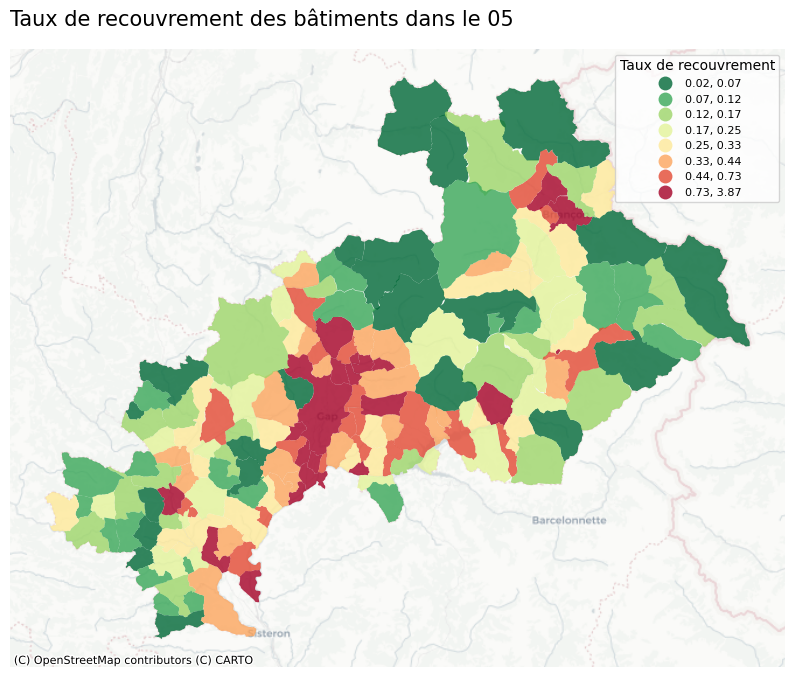

In [355]:
# Faire la carte

Carte1, ax = plt.subplots(figsize=(10,10))

communes.to_crs('EPSG:3857').plot(ax=ax, k=8, column="indic", cmap='RdYlGn_r',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux de recouvrement", 'loc': 'upper right', 'title_fontsize':10, 'fontsize':8})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Taux de recouvrement des bâtiments dans le 05", loc='left', fontsize=15)


### Exercice à l'échelle des sections cadastrale


In [356]:
# Calculer la surface des sections

sections["Surface_sections"] = sections['geometry'].area
sections["Surface_sections"]= sections["Surface_sections"].astype(int)
sections.head()

,id,commune,prefixe,code,created,updated,geometry,Surface_sections
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400...",12839552
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177...",1610471
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321
3,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147
4,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.780, 968869.928 6...",13200604


In [357]:
# Faire la jointure spatiale entre les batiments et les sections cadastrales

BatimentsCentro = batiments.copy()
BatimentsCentro.geometry = BatimentsCentro['geometry'].centroid

Batimentssections = gpd.sjoin(BatimentsCentro, sections)
Batimentssections.head(3)

,commune_left,nom,type,created_left,updated_left,geometry,Surface_batiments,index_right,id,commune_right,prefixe,code,created_right,updated_right,Surface_sections
0,05003,None,02,2006-11-26,2014-02-14,POINT (1004395.334 6419015.429),0,2,050030000A,05003,000,A,2006-11-26,2014-02-14,5100321
1,05003,None,01,2006-11-13,2014-02-14,POINT (1004468.137 6418962.664),20,2,050030000A,05003,000,A,2006-11-26,2014-02-14,5100321
2,05003,None,01,2015-01-29,2015-01-29,POINT (1004469.608 6418975.951),43,2,050030000A,05003,000,A,2006-11-26,2014-02-14,5100321


In [358]:
# Calculer la somme des surfaces des bâtiments par sections cadastrales

SurfaceBatisSections= Batimentssections.groupby('id').agg({'Surface_batiments':'sum'})
SurfaceBatisSections.head()

,Surface_batiments
id,
050010000A,615
050010000B,142
050010000C,193
050010000D,4999
050010000E,165


In [359]:
# Jointure attributaire pour enrichir la couche des communes

sections = sections.merge(SurfaceBatisSections,left_on='id', right_on='id')
sections.head()

,id,commune,prefixe,code,created,updated,geometry,Surface_sections,Surface_batiments
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400...",12839552,615
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177...",1610471,142
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321,401
3,050040000A,05004,000,A,2017-04-14,2017-05-23,"POLYGON ((952035.688 6396444.305, 952026.181 6...",2581147,23066
4,050060000A,05006,000,A,2016-09-21,2017-05-23,"POLYGON ((968903.758 6414486.780, 968869.928 6...",13200604,226


In [360]:
# Créer l'indicateur de tx de recouvrement des batimenst

sections["indic"] = sections["Surface_batiments"] / sections["Surface_sections"]*100
sections.head(3)

,id,commune,prefixe,code,created,updated,geometry,Surface_sections,Surface_batiments,indic
0,050010000A,05001,000,A,2006-11-01,2019-12-03,"POLYGON ((1007707.451 6418595.634, 1007710.400...",12839552,615,0.004790
1,050010000B,05001,000,B,2006-11-01,2019-12-03,"POLYGON ((1009315.792 6418632.565, 1009315.177...",1610471,142,0.008817
2,050030000A,05003,000,A,2006-11-26,2014-02-14,"POLYGON ((1004822.834 6418680.779, 1004820.601...",5100321,401,0.007862


Text(0.0, 1.0, 'Taux de recouvrement des bâtiments dans le 05')

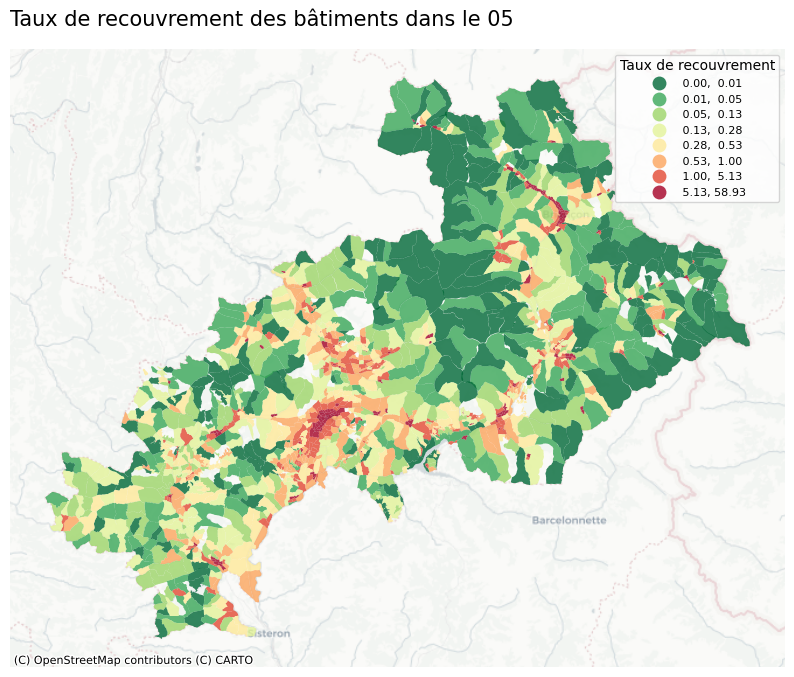

In [361]:
# Faire la carte

Carte1, ax = plt.subplots(figsize=(10,10))

sections.to_crs('EPSG:3857').plot(ax=ax, k=8, column="indic", cmap='RdYlGn_r',scheme='quantiles', alpha=0.8, categorical=False,
                                    legend=True, legend_kwds={'title': "Taux de recouvrement", 'loc': 'upper right', 'title_fontsize':10, 'fontsize':8})
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.title("Taux de recouvrement des bâtiments dans le 05", loc='left', fontsize=15)
